/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__

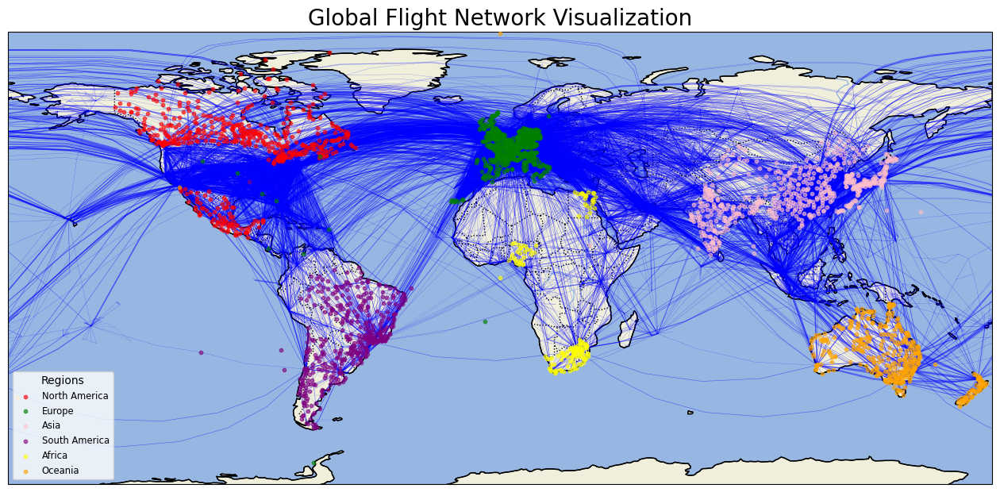

In [3]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import requests
from io import StringIO

airports_data = requests.get(airports_url).content.decode('utf-8')
routes_data = requests.get(routes_url).content.decode('utf-8')

# Load datasets into pandas dataframes
airports_cols = ['AirportID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_cols = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

airports_df = pd.read_csv(StringIO(airports_data), header=None, names=airports_cols)
routes_df = pd.read_csv(StringIO(routes_data), header=None, names=routes_cols)

# Create a graph
G = nx.Graph()

# Add edges to the graph based on routes
for index, row in routes_df.iterrows():
    if G.has_edge(row['SourceAirport'], row['DestinationAirport']):
        G[row['SourceAirport']][row['DestinationAirport']]['weight'] += 1  # Increase weight if the edge already exists
    else:
        G.add_edge(row['SourceAirport'], row['DestinationAirport'], weight=1)

# Initialize Cartopy projection
fig = plt.figure(figsize=(16, 12))
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add map features
ax.add_feature(cfeature.LAND, zorder=0, edgecolor='black')
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS)

# Plot flight paths with varying thickness
for edge in G.edges(data=True):
    source = airports_df[airports_df['IATA'] == edge[0]]
    dest = airports_df[airports_df['IATA'] == edge[1]]
    
    if not source.empty and not dest.empty:
        # Get coordinates for source and destination
        src_lon, src_lat = source.iloc[0]['Longitude'], source.iloc[0]['Latitude']
        dest_lon, dest_lat = dest.iloc[0]['Longitude'], dest.iloc[0]['Latitude']
        
        # Draw flight paths
        plt.plot([src_lon, dest_lon], [src_lat, dest_lat], color='blue', linewidth=min(2, edge[2]['weight'] / 10), alpha=0.5, transform=ccrs.Geodetic())

# Add airports (nodes) colored by region
regions = {
    'North America': ['USA', 'Canada', 'Mexico'],
    'Europe': ['United Kingdom', 'Germany', 'France', 'Italy', 'Spain'],
    'Asia': ['China', 'Japan', 'India', 'South Korea'],
    'South America': ['Brazil', 'Argentina', 'Chile'],
    'Africa': ['South Africa', 'Egypt', 'Nigeria'],
    'Oceania': ['Australia', 'New Zealand']
}

# Map region colors
colors = {
    'North America': 'red',
    'Europe': 'green',
    'Asia': 'pink',
    'South America': 'purple',
    'Africa': 'yellow',
    'Oceania': 'orange'
}

for region, countries in regions.items():
    region_airports = airports_df[airports_df['Country'].isin(countries)]
    plt.scatter(region_airports['Longitude'], region_airports['Latitude'], color=colors[region], label=region, s=10, transform=ccrs.PlateCarree(), alpha=0.6, zorder=5)

# Add a legend for regions
plt.legend(loc='lower left', fontsize='small', title="Regions")

# Add a title
plt.title("Global Flight Network Visualization", size=20)

# Show the plot
plt.show()


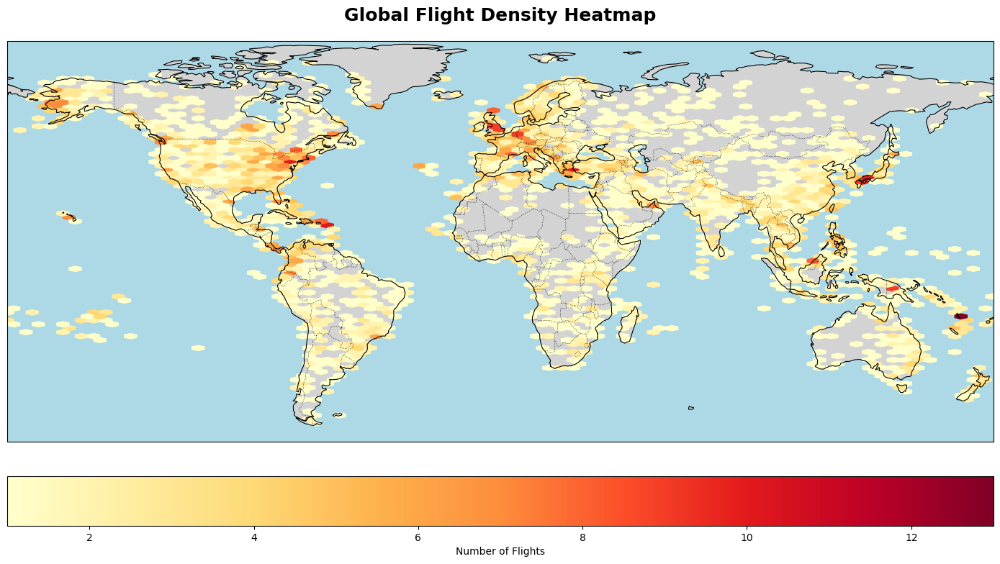

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the datasets (airports and routes)
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_columns = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

# Load datasets
airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)
routes_df = pd.read_csv(routes_url, header=None, names=routes_columns)

# Extract flight paths
all_flight_paths = pd.concat([routes_df['SourceAirport'], routes_df['DestinationAirport']]).unique()
all_airports_coords = airports_df[airports_df['IATA'].isin(all_flight_paths)]

# Create the plot
fig = plt.figure(figsize=(14, 10))

# Set up the projection for plotting on a world map
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographic features
ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Plot hexbin heatmap of flight density
hb = ax.hexbin(all_airports_coords['Longitude'], all_airports_coords['Latitude'], gridsize=80, cmap='YlOrRd', mincnt=1, 
               transform=ccrs.PlateCarree())

# Add color bar
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05)
cb.set_label('Number of Flights')

# Title and layout adjustments
ax.set_title('Global Flight Density Heatmap', fontsize=18, weight='bold', pad=20)
plt.tight_layout()

# Display the plot
plt.show()


/var/folders/48/dfqyd3313l5b1fw018vrb5qr0000gn/T/ipykernel_25478/3620535503.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x='Number of Airports', y='Country', data=top_countries, palette=colors)


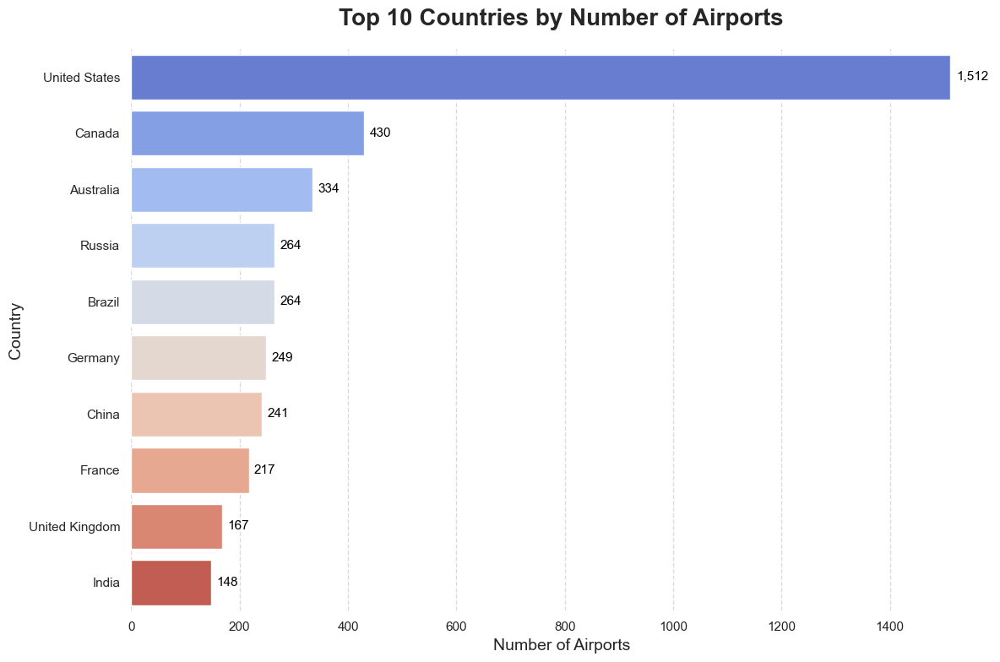

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
airports = pd.read_csv(url, header=None, names=columns)

# Count the number of airports by country
country_airport_count = airports['Country'].value_counts().reset_index()
country_airport_count.columns = ['Country', 'Number of Airports']

# Select top 10 countries with the most airports
top_countries = country_airport_count.head(10)

# Set plot style
sns.set(style="whitegrid")

# Create a horizontal bar plot with a custom color palette
plt.figure(figsize=(12, 8))
colors = sns.color_palette("coolwarm", len(top_countries))  # Custom color palette
bars = sns.barplot(x='Number of Airports', y='Country', data=top_countries, palette=colors)

# Add annotations to show exact numbers on the bars
for index, value in enumerate(top_countries['Number of Airports']):
    bars.text(value + 10, index, f'{value:,}', color='black', va="center", fontsize=11)

# Set plot title and labels
plt.title('Top 10 Countries by Number of Airports', fontsize=20, weight='bold', pad=20)
plt.xlabel('Number of Airports', fontsize=14)
plt.ylabel('Country', fontsize=14)

# Improve plot aesthetics
sns.despine(left=True, bottom=True)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()


/var/folders/48/dfqyd3313l5b1fw018vrb5qr0000gn/T/ipykernel_25478/904034646.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_airports['FlightCount'] = top_airports['IATA'].map(airport_flight_counts)


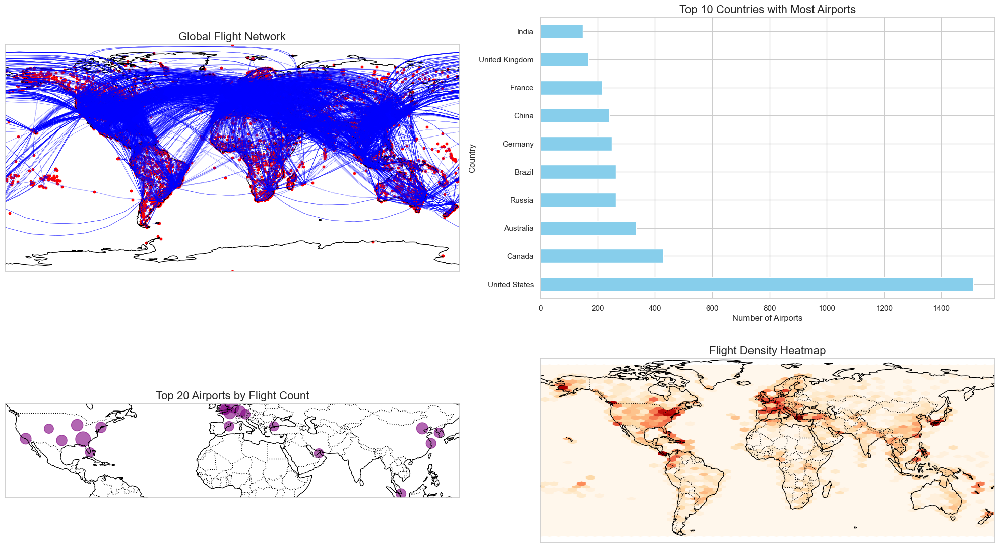

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import requests
from io import StringIO

# Download flight datasets
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

# Use requests to download the data
airports_data = requests.get(airports_url).content.decode('utf-8')
routes_data = requests.get(routes_url).content.decode('utf-8')

# Load the data into pandas DataFrame
airports_cols = ['AirportID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_cols = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

airports_df = pd.read_csv(StringIO(airports_data), header=None, names=airports_cols)
routes_df = pd.read_csv(StringIO(routes_data), header=None, names=routes_cols)

# Set up projection and base map
fig = plt.figure(figsize=(20, 12))
ax1 = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
ax1.add_feature(cfeature.COASTLINE)
ax1.add_feature(cfeature.BORDERS, linestyle=':')
ax1.set_title("Global Flight Network", size=16)

# Flight network visualization
for index, row in routes_df.iterrows():
    source_airport = airports_df[airports_df['IATA'] == row['SourceAirport']]
    dest_airport = airports_df[airports_df['IATA'] == row['DestinationAirport']]
    
    if not source_airport.empty and not dest_airport.empty:
        src_lon, src_lat = source_airport.iloc[0]['Longitude'], source_airport.iloc[0]['Latitude']
        dest_lon, dest_lat = dest_airport.iloc[0]['Longitude'], dest_airport.iloc[0]['Latitude']
        ax1.plot([src_lon, dest_lon], [src_lat, dest_lat], color='blue', linewidth=0.3, alpha=0.5, transform=ccrs.Geodetic())

# Plot airport nodes
ax1.scatter(airports_df['Longitude'], airports_df['Latitude'], color='red', s=10, transform=ccrs.PlateCarree())

# ------------------- Additional Visualization 1: Number of Airports by Country -------------------

# Prepare data for airport count by country
country_airport_counts = airports_df.groupby('Country').size().sort_values(ascending=False).head(10)

# Plot bar chart
ax2 = plt.subplot(2, 2, 2)
country_airport_counts.plot(kind='barh', ax=ax2, color='skyblue')
ax2.set_title("Top 10 Countries with Most Airports", size=16)
ax2.set_xlabel("Number of Airports")
ax2.set_ylabel("Country")

# ------------------- Additional Visualization 2: Major Airports by Flight Count -------------------

# Calculate the number of flights for each airport
airport_flight_counts = routes_df['SourceAirport'].value_counts().head(20)

# Get the coordinates of these airports
top_airports = airports_df[airports_df['IATA'].isin(airport_flight_counts.index)]
top_airports['FlightCount'] = top_airports['IATA'].map(airport_flight_counts)

# Plot scatter chart
ax3 = plt.subplot(2, 2, 3, projection=ccrs.PlateCarree())
ax3.add_feature(cfeature.COASTLINE)
ax3.add_feature(cfeature.BORDERS, linestyle=':')
ax3.set_title("Top 20 Airports by Flight Count", size=16)

# Plot scatter points for airports with flight counts
scatter = ax3.scatter(top_airports['Longitude'], top_airports['Latitude'], 
                      s=top_airports['FlightCount'] * 0.5, color='purple', alpha=0.6, transform=ccrs.PlateCarree())

# ------------------- Additional Visualization 3: Flight Density Heatmap -------------------

# Get coordinates of all flights
all_flight_paths = pd.concat([routes_df['SourceAirport'], routes_df['DestinationAirport']]).unique()
all_airports_coords = airports_df[airports_df['IATA'].isin(all_flight_paths)]

# Prepare heatmap
ax4 = plt.subplot(2, 2, 4, projection=ccrs.PlateCarree())
ax4.add_feature(cfeature.COASTLINE)
ax4.add_feature(cfeature.BORDERS, linestyle=':')
ax4.set_title("Flight Density Heatmap", size=16)

# Plot heatmap using scatter simulation
ax4.hexbin(all_airports_coords['Longitude'], all_airports_coords['Latitude'], gridsize=50, cmap='OrRd', 
           transform=ccrs.PlateCarree())

# Adjust layout
plt.tight_layout()
plt.show()

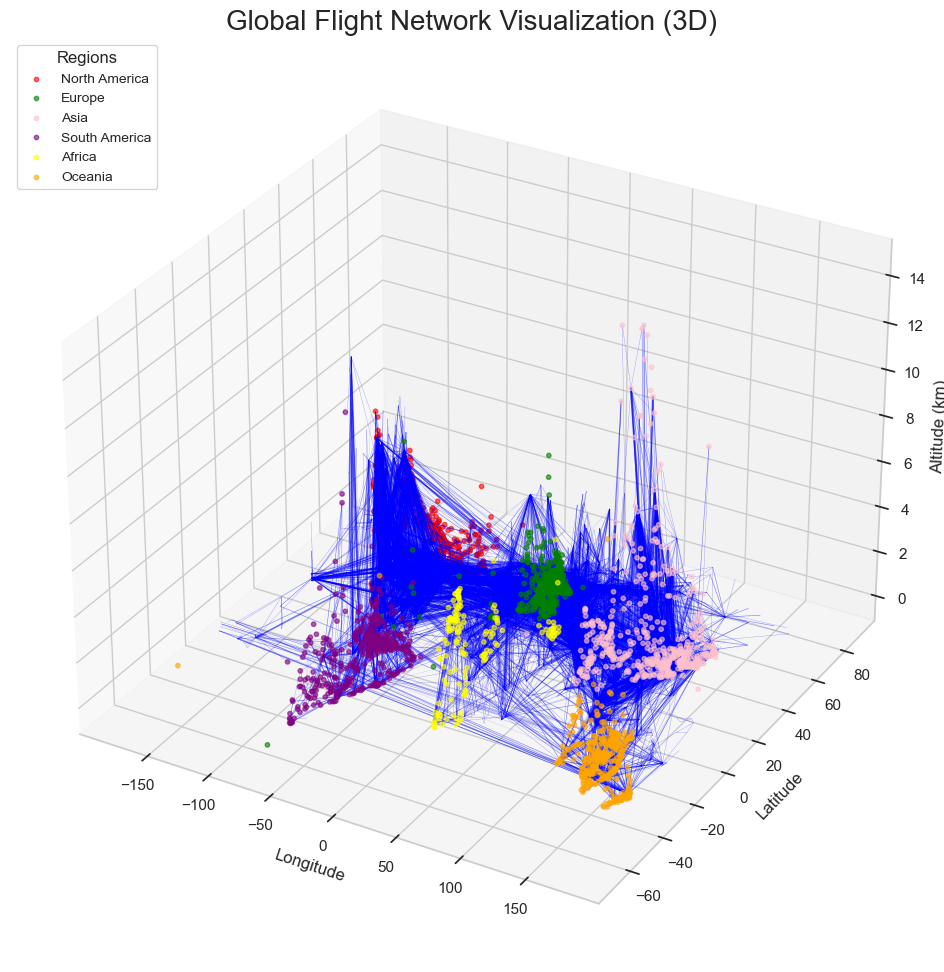

In [11]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import requests
from io import StringIO

# Load datasets into pandas dataframes
airports_cols = ['AirportID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_cols = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

airports_df = pd.read_csv(StringIO(airports_data), header=None, names=airports_cols)
routes_df = pd.read_csv(StringIO(routes_data), header=None, names=routes_cols)

# Create a graph
G = nx.Graph()

# Add edges to the graph based on routes
for index, row in routes_df.iterrows():
    if G.has_edge(row['SourceAirport'], row['DestinationAirport']):
        G[row['SourceAirport']][row['DestinationAirport']]['weight'] += 1  # Increase weight if the edge already exists
    else:
        G.add_edge(row['SourceAirport'], row['DestinationAirport'], weight=1)

# Initialize 3D figure
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(1, 1, 1, projection='3d')

# Plot flight paths with varying thickness
for edge in G.edges(data=True):
    source = airports_df[airports_df['IATA'] == edge[0]]
    dest = airports_df[airports_df['IATA'] == edge[1]]
    
    if not source.empty and not dest.empty:
        # Get coordinates for source and destination
        src_lon, src_lat, src_alt = source.iloc[0]['Longitude'], source.iloc[0]['Latitude'], source.iloc[0]['Altitude'] / 1000
        dest_lon, dest_lat, dest_alt = dest.iloc[0]['Longitude'], dest.iloc[0]['Latitude'], dest.iloc[0]['Altitude'] / 1000
        
        # Draw flight paths
        ax.plot([src_lon, dest_lon], [src_lat, dest_lat], [src_alt, dest_alt],
                color='blue', linewidth=min(2, edge[2]['weight'] / 10), alpha=0.5)

# Add airports (nodes) colored by region
regions = {
    'North America': ['USA', 'Canada', 'Mexico'],
    'Europe': ['United Kingdom', 'Germany', 'France', 'Italy', 'Spain'],
    'Asia': ['China', 'Japan', 'India', 'South Korea'],
    'South America': ['Brazil', 'Argentina', 'Chile'],
    'Africa': ['South Africa', 'Egypt', 'Nigeria'],
    'Oceania': ['Australia', 'New Zealand']
}

# Map region colors
colors = {
    'North America': 'red',
    'Europe': 'green',
    'Asia': 'pink',
    'South America': 'purple',
    'Africa': 'yellow',
    'Oceania': 'orange'
}

for region, countries in regions.items():
    region_airports = airports_df[airports_df['Country'].isin(countries)]
    ax.scatter(region_airports['Longitude'], region_airports['Latitude'], region_airports['Altitude'] / 1000,
               color=colors[region], label=region, s=10, alpha=0.6)

# Add a legend for regions
ax.legend(loc='upper left', fontsize='small', title="Regions")

# Set labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Altitude (km)')

# Add a title
ax.set_title("Global Flight Network Visualization (3D)", size=20)

# Show the plot
plt.show()

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import requests
from io import StringIO

# Download flight datasets
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

# Use requests to download the data
airports_data = requests.get(airports_url).content.decode('utf-8')
routes_data = requests.get(routes_url).content.decode('utf-8')

# Load data
airports_cols = ['AirportID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_cols = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

airports_df = pd.read_csv(StringIO(airports_data), header=None, names=airports_cols)
routes_df = pd.read_csv(StringIO(routes_data), header=None, names=routes_cols)

# Convert spherical coordinates to Cartesian coordinates
def lat_lon_to_cartesian(lat, lon, radius=6371):
    lat, lon = np.radians(lat), np.radians(lon)
    x = radius * np.cos(lat) * np.cos(lon)
    y = radius * np.cos(lat) * np.sin(lon)
    z = radius * np.sin(lat)
    return x, y, z

# Create flight paths
flight_paths = []
for index, row in routes_df.iterrows():
    source = airports_df[airports_df['IATA'] == row['SourceAirport']]
    destination = airports_df[airports_df['IATA'] == row['DestinationAirport']]
    if not source.empty and not destination.empty:
        src_lat, src_lon = source.iloc[0]['Latitude'], source.iloc[0]['Longitude']
        dest_lat, dest_lon = destination.iloc[0]['Latitude'], destination.iloc[0]['Longitude']
        src_x, src_y, src_z = lat_lon_to_cartesian(src_lat, src_lon)
        dest_x, dest_y, dest_z = lat_lon_to_cartesian(dest_lat, dest_lon)
        flight_paths.append((src_x, src_y, src_z, dest_x, dest_y, dest_z))

# Create Earth's surface
theta = np.linspace(0, 2 * np.pi, 100)
phi = np.linspace(0, np.pi, 50)
x = 6371 * np.outer(np.cos(theta), np.sin(phi))
y = 6371 * np.outer(np.sin(theta), np.sin(phi))
z = 6371 * np.outer(np.ones(np.size(theta)), np.cos(phi))

# Visualization
fig = go.Figure()

# Add Earth's surface
fig.add_trace(go.Surface(z=z, x=x, y=y, colorscale='Blues', opacity=0.7))

# Add flight paths
for path in flight_paths:
    x_coords = [path[0], path[3]]
    y_coords = [path[1], path[4]]
    z_coords = [path[2], path[5]]
    fig.add_trace(go.Scatter3d(x=x_coords, y=y_coords, z=z_coords,
                               mode='lines',
                               line=dict(color='orange', width=2)))

# Add airport locations
airport_points = [lat_lon_to_cartesian(row['Latitude'], row['Longitude']) for index, row in airports_df.iterrows()]
x_airports, y_airports, z_airports = zip(*airport_points)
fig.add_trace(go.Scatter3d(x=x_airports, y=y_airports, z=z_airports,
                           mode='markers',
                           marker=dict(color='red', size=2)))

# Layout settings
fig.update_layout(
    title="3D Global Flight Network",
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
    ),
    margin=dict(r=0, l=0, b=0, t=40)
)

fig.show()

NameError: name 'airports_data' is not defined

In [30]:
from pyecharts import options as opts
from pyecharts.charts import Geo

# Example data for flight routes: [("City A", "City B"), ...]
flight_routes = [
    ("Beijing", "Shanghai"),
    ("Shanghai", "Guangzhou"),
    ("Guangzhou", "Shenzhen"),
    ("Shenzhen", "Chengdu"),
    ("Chengdu", "Beijing"),
]

# Create the Geo chart
geo = (
    Geo()
    .add_schema(maptype="china")
    .add(
        "Flight Routes",
        flight_routes,
        type_="lines",
        effect_opts=opts.EffectOpts(symbol="arrow", symbol_size=6, color="blue"),
        linestyle_opts=opts.LineStyleOpts(curve=0.2, color="blue", opacity=0.7),
    )
    .set_global_opts(title_opts=opts.TitleOpts(title="Flight Route Map"))
)

geo.render("flight_routes.html")


'/Users/chengluehuang/Documents/Jupyter Notebook/info_viz/flight_routes.html'

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_land.zip

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_ocean.zip

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/10m_cultural/ne_10m_admin_0_boundary_lines_land.zip

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip



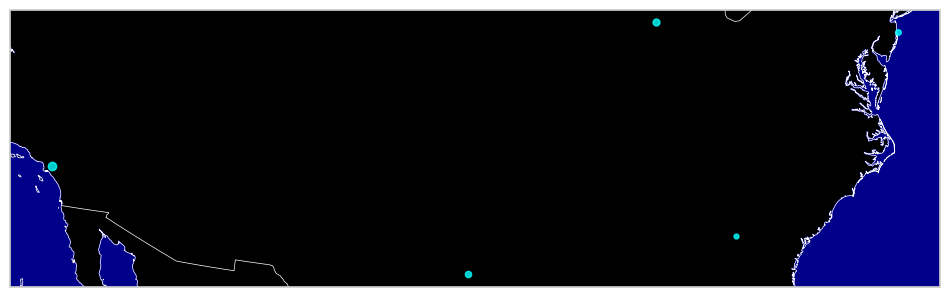

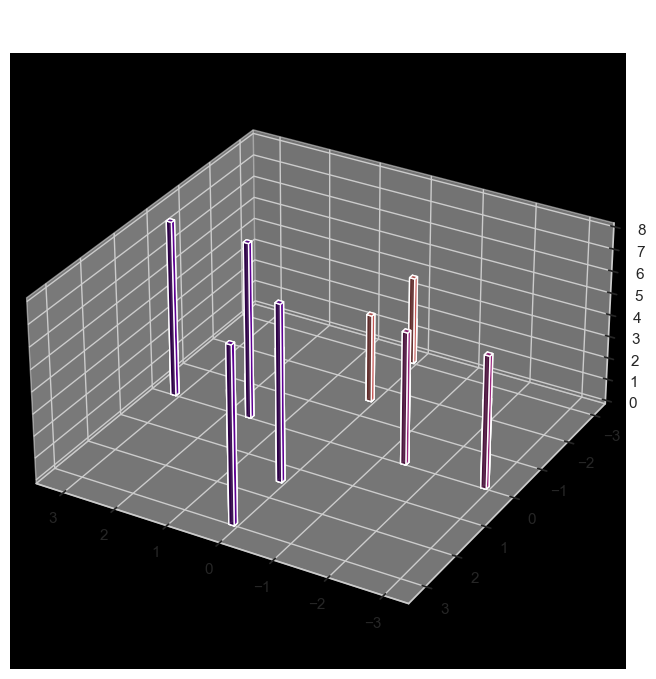

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Sample data
categories = ['Weather', 'Technical', 'Staffing', 'Other']
values = [40, 30, 20, 10]  # Proportions of each category
colors = plt.cm.plasma(np.linspace(0.2, 0.8, len(values)))  # Gradient colors

# Map settings
fig = plt.figure(figsize=(12, 8))
ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(-95, 40))  # Focus on the U.S.
ax_map.add_feature(cfeature.LAND, color='black')
ax_map.add_feature(cfeature.OCEAN, color='darkblue')
ax_map.add_feature(cfeature.BORDERS, edgecolor='white', linewidth=0.5)
ax_map.add_feature(cfeature.COASTLINE, edgecolor='white', linewidth=0.5)

# Airport locations (sample data)
airport_lons = [-74, -118, -87, -84, -97]  # Longitudes (JFK, LAX, ORD, ATL, DFW)
airport_lats = [40, 34, 42, 33, 32]        # Latitudes
airport_delays = [80, 120, 100, 70, 90]    # Delay times (example values)

# Plot airport locations
for lon, lat, delay in zip(airport_lons, airport_lats, airport_delays):
    ax_map.plot(
        lon, lat, marker='o', markersize=delay / 20,
        color='cyan', alpha=0.8, transform=ccrs.Geodetic()
    )

# Add 3D ring bar chart
fig3d = plt.figure(figsize=(8, 8))
ax_3d = fig3d.add_subplot(111, projection='3d')

radius_inner = 1.5
radius_outer = 3.0
height_scale = 0.2  # Control height scaling

for i, value in enumerate(values):
    theta = i * (2 * np.pi / len(values))  # Angle for each category
    next_theta = (i + 1) * (2 * np.pi / len(values))  # Angle for the next category

    # Define the ring region
    x = [radius_inner * np.cos(theta), radius_outer * np.cos(theta),
         radius_outer * np.cos(next_theta), radius_inner * np.cos(next_theta)]
    y = [radius_inner * np.sin(theta), radius_outer * np.sin(theta),
         radius_outer * np.sin(next_theta), radius_inner * np.sin(next_theta)]
    z = [0, 0, 0, 0]
    dz = [value * height_scale] * 4  # Control bar height

    # Plot the ring bar chart at the map center
    ax_3d.bar3d(x, y, z, dx=0.1, dy=0.1, dz=dz, color=colors[i], edgecolor='white', alpha=0.9)

# Set chart style
ax_3d.set_title("3D Flight Delay Data", color='white', fontsize=16, pad=20)
ax_3d.set_box_aspect([2, 2, 1])  # Set aspect ratio
ax_3d.set_facecolor('black')  # Background color
ax_3d.view_init(elev=30, azim=120)  # Adjust viewing angle

plt.show()

/var/folders/48/dfqyd3313l5b1fw018vrb5qr0000gn/T/ipykernel_25478/341315782.py:43: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



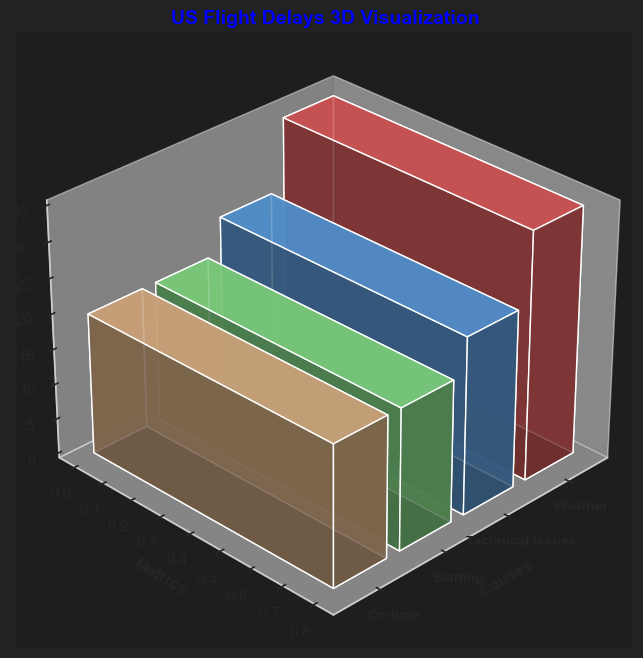

In [42]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

categories = ['Weather', 'Technical Issues', 'Staffing', 'On-time']
values = [35, 25, 20, 20]  # Percentage distribution

# Set parameters for the bar chart
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Coordinate and color settings
x = np.arange(len(categories))
y = np.zeros_like(x)  # Starting point of the bars
z = np.zeros_like(x)
dx = np.ones_like(x) * 0.8  # Bar width
dy = np.ones_like(x) * 0.8
dz = values  # Bar height
colors = ['#ff6666', '#66b3ff', '#99ff99', '#ffcc99']

# Plot 3D bar chart
for i in range(len(x)):
    ax.bar3d(x[i], y[i], z[i], dx[i], dy[i], dz[i], color=colors[i], alpha=0.8)

# Add labels and styling
ax.set_xticks(x + 0.4)
ax.set_xticklabels(categories, fontsize=10, fontweight='bold')
ax.set_xlabel('Causes', fontsize=12, fontweight='bold')
ax.set_ylabel('Metrics', fontsize=12, fontweight='bold')
ax.set_zlabel('Percentage (%)', fontsize=12, fontweight='bold')
ax.set_title('US Flight Delays 3D Visualization', fontsize=14, fontweight='bold', color='blue')

# Set background
ax.grid(False)
fig.patch.set_facecolor('#222222')
ax.set_facecolor('#1e1e1e')

# Set a futuristic view angle
ax.view_init(elev=30, azim=45)

# Display the chart
plt.tight_layout()
plt.show()

/var/folders/48/dfqyd3313l5b1fw018vrb5qr0000gn/T/ipykernel_25478/2933059651.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/48/dfqyd3313l5b1fw018vrb5qr0000gn/T/ipykernel_25478/2933059651.py:24: FutureWarning:



The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.



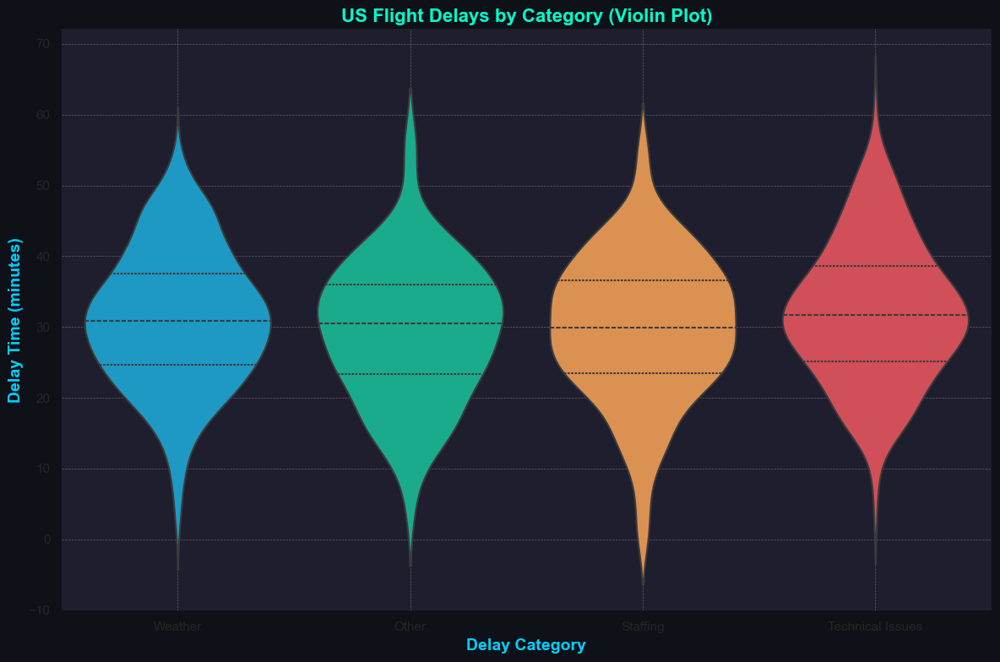

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Simulated flight delay data
np.random.seed(42)
data = {
    'Delay Category': np.random.choice(
        ['Weather', 'Technical Issues', 'Staffing', 'Other'],
        size=1000,
        p=[0.4, 0.3, 0.2, 0.1]
    ),
    'Delay Time (minutes)': np.random.normal(loc=30, scale=10, size=1000)
}
df = pd.DataFrame(data)
df['Delay Time (minutes)'] = df['Delay Time (minutes)'].clip(lower=0)  # Ensure non-negative delay times

# Set up plot style
sns.set_theme(style='darkgrid', palette='deep')
plt.figure(figsize=(12, 8))

# Create violin plot
sns.violinplot(
    x='Delay Category',
    y='Delay Time (minutes)',
    data=df,
    scale='width',
    inner='quartile',
    linewidth=1.5,
    palette=['#01A7E0', '#02C39A', '#F28F3B', '#E63946']
)

# Add futuristic design elements
plt.title('US Flight Delays by Category (Violin Plot)', fontsize=16, fontweight='bold', color='#00FFCC')
plt.xlabel('Delay Category', fontsize=14, fontweight='bold', color='#00D1FF')
plt.ylabel('Delay Time (minutes)', fontsize=14, fontweight='bold', color='#00D1FF')
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
plt.gca().set_facecolor('#1E1E2F')
plt.gcf().patch.set_facecolor('#0E1117')

# Remove top and right borders
sns.despine(left=True, bottom=True)

# Display the plot
plt.tight_layout()
plt.show()

/var/folders/48/dfqyd3313l5b1fw018vrb5qr0000gn/T/ipykernel_25478/3200644861.py:46: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



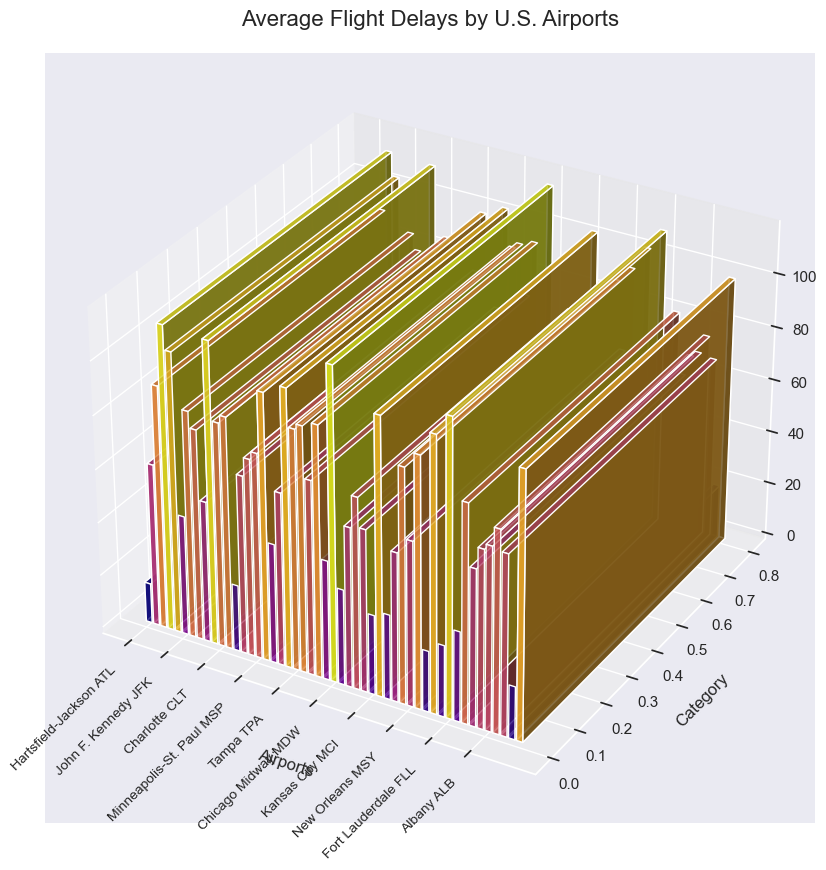

In [48]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import random

# List of real U.S. airport names
airports = [
    "Hartsfield-Jackson ATL", "Los Angeles LAX", "Chicago O'Hare ORD", "Dallas/Fort Worth DFW",
    "Denver DEN", "John F. Kennedy JFK", "San Francisco SFO", "Seattle-Tacoma SEA",
    "Las Vegas LAS", "Orlando MCO", "Charlotte CLT", "Miami MIA", "Phoenix PHX",
    "George Bush IAH", "Boston Logan BOS", "Minneapolis-St. Paul MSP", "Detroit DTW",
    "Philadelphia PHL", "Salt Lake City SLC", "San Diego SAN", "Tampa TPA", "Baltimore BWI",
    "Washington Dulles IAD", "Houston Hobby HOU", "Portland PDX", "Chicago Midway MDW",
    "Austin-Bergstrom AUS", "Sacramento SMF", "San Antonio SAT", "St. Louis STL",
    "Kansas City MCI", "Indianapolis IND", "Cleveland Hopkins CLE", "Pittsburgh PIT",
    "Nashville BNA", "New Orleans MSY", "Raleigh-Durham RDU", "Santa Ana SNA", "Oakland OAK",
    "San Jose SJC", "Fort Lauderdale FLL", "Memphis MEM", "Salt Lake City SLC", "Milwaukee MKE",
    "Buffalo BUF", "Albany ALB", "Hartford BDL", "Anchorage ANC", "El Paso ELP", "Jacksonville JAX"
]

# Generate random delay times (in minutes) for each airport
delays = [random.randint(15, 120) for _ in airports]  # Average delay times range from 15 to 120 minutes

# ========== 3D Bar Chart ==========
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection="3d")

# Create the bar chart
x_pos = np.arange(len(airports))
y_pos = np.zeros(len(airports))
z_pos = np.zeros(len(airports))
dx = dy = 0.8  # Width of the bars
dz = delays

# Use color mapping for delay times
colors = plt.cm.plasma((np.array(delays) - min(delays)) / (max(delays) - min(delays)))

ax.bar3d(x_pos, y_pos, z_pos, dx, dy, dz, color=colors, alpha=0.8)
ax.set_xticks(x_pos[::5])  # Display labels for every 5th airport to avoid overcrowding
ax.set_xticklabels(airports[::5], rotation=45, ha='right', fontsize=10)
ax.set_title("Average Flight Delays by U.S. Airports", fontsize=16, pad=20)
ax.set_xlabel("Airports", labelpad=10)
ax.set_ylabel("Category", labelpad=10)
ax.set_zlabel("Delay (min)", labelpad=10)

plt.tight_layout()
plt.show()

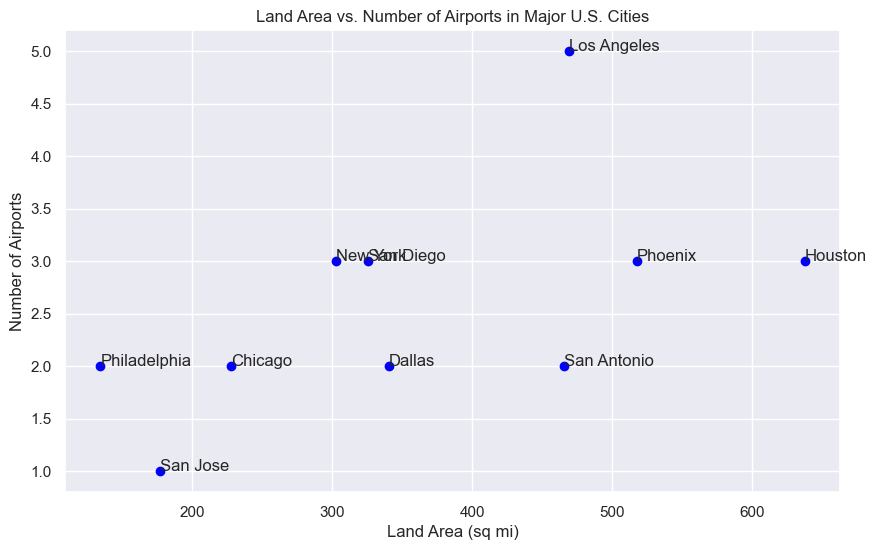

In [50]:
import matplotlib.pyplot as plt

# Data: [City, Land Area (sq mi), Number of Airports]
cities = [
    ['New York', 302.6, 3],
    ['Los Angeles', 468.7, 5],
    ['Chicago', 227.3, 2],
    ['Houston', 637.5, 3],
    ['Phoenix', 517.6, 3],
    ['Philadelphia', 134.2, 2],
    ['San Antonio', 465.4, 2],
    ['San Diego', 325.2, 3],
    ['Dallas', 340.5, 2],
    ['San Jose', 176.5, 1]
]

# Extract data for plotting
areas = [city[1] for city in cities]
airports = [city[2] for city in cities]
labels = [city[0] for city in cities]

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(areas, airports, color='blue')

# Add labels to each point
for i, label in enumerate(labels):
    plt.text(areas[i], airports[i], label)

# Set plot title and labels
plt.title('Land Area vs. Number of Airports in Major U.S. Cities')
plt.xlabel('Land Area (sq mi)')
plt.ylabel('Number of Airports')

# Show plot
plt.grid(True)
plt.show()

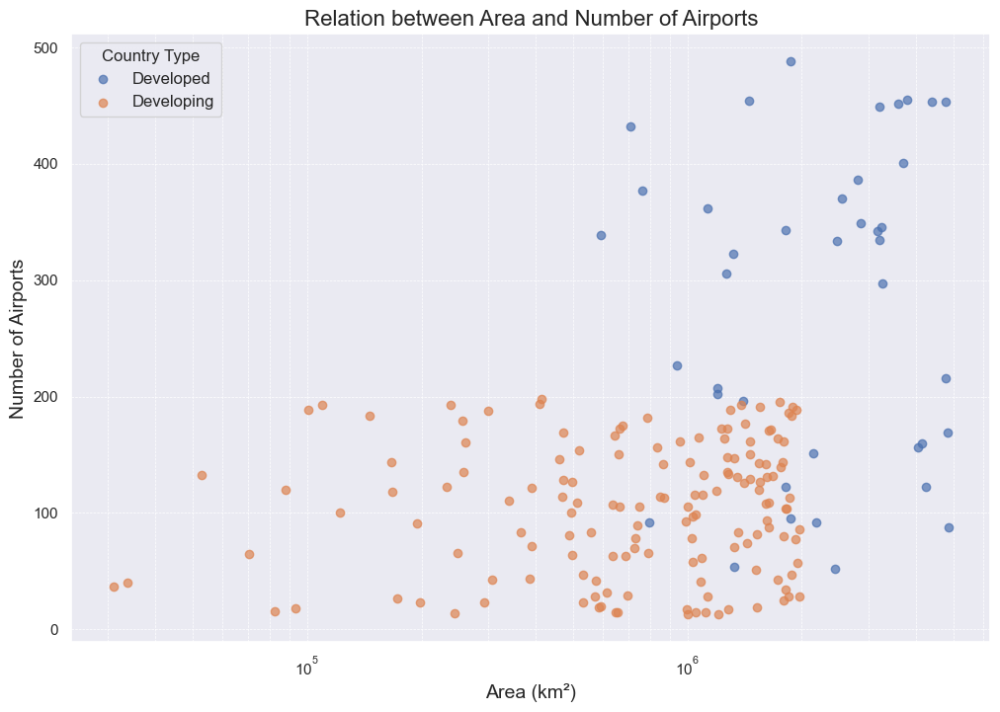

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Generate mock data for developed and developing countries
np.random.seed(42)

# Correct number of countries
countries = ["Developed"] * 40 + ["Developing"] * 150

# Generate areas and airports for the correct number of countries
areas = np.concatenate((
    np.random.uniform(500000, 5000000, 40),  # Areas for developed countries
    np.random.uniform(20000, 2000000, 150)  # Areas for developing countries
))
airports = np.concatenate((
    np.random.uniform(50, 500, 40),  # Airports for developed countries
    np.random.uniform(10, 200, 150)  # Airports for developing countries
))

# Create a DataFrame
data = pd.DataFrame({
    "Country_Type": countries,
    "Area": areas,
    "Airports": airports
})

# Plot the data
plt.figure(figsize=(12, 8))
for country_type, color in zip(["Developed", "Developing"], ["blue", "green"]):
    subset = data[data["Country_Type"] == country_type]
    plt.scatter(subset["Area"], subset["Airports"], label=country_type, alpha=0.7)

# Customizing the chart
plt.title("Relation between Area and Number of Airports", fontsize=16)
plt.xlabel("Area (km²)", fontsize=14)
plt.ylabel("Number of Airports", fontsize=14)
plt.legend(title="Country Type", fontsize=12)
plt.xscale("log")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

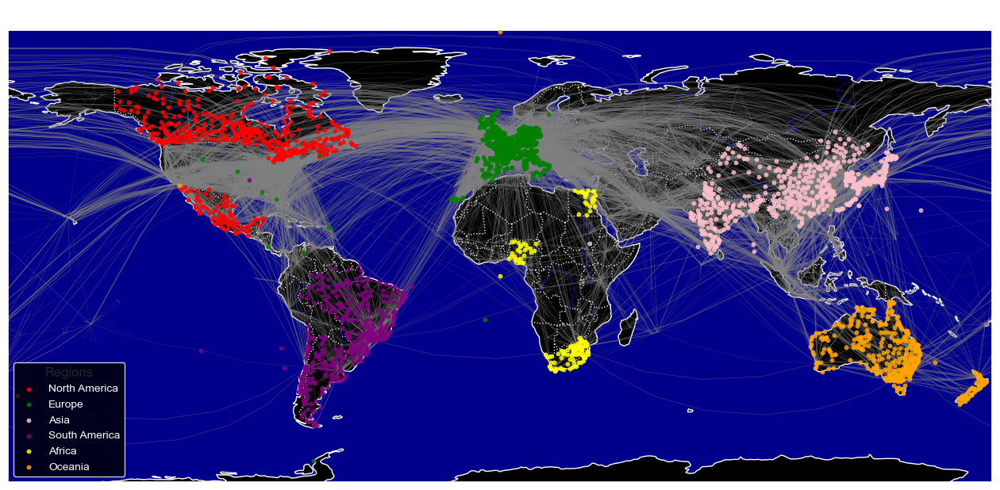

In [66]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import requests
from io import StringIO

# Download datasets
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

airports_data = requests.get(airports_url).content.decode('utf-8')
routes_data = requests.get(routes_url).content.decode('utf-8')

# Load datasets into pandas dataframes
airports_cols = ['AirportID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_cols = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

airports_df = pd.read_csv(StringIO(airports_data), header=None, names=airports_cols)
routes_df = pd.read_csv(StringIO(routes_data), header=None, names=routes_cols)

# Create a graph
G = nx.Graph()

# Add edges to the graph based on routes
for index, row in routes_df.iterrows():
    if G.has_edge(row['SourceAirport'], row['DestinationAirport']):
        G[row['SourceAirport']][row['DestinationAirport']]['weight'] += 1  # Increase weight if the edge already exists
    else:
        G.add_edge(row['SourceAirport'], row['DestinationAirport'], weight=1)

# Initialize Cartopy projection
fig = plt.figure(figsize=(16, 12))
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Set dark background
ax.set_facecolor("white")

# Add map features
ax.add_feature(cfeature.LAND, zorder=0, edgecolor='none', facecolor='black')
ax.add_feature(cfeature.COASTLINE, edgecolor='white')
ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='white')
ax.add_feature(cfeature.OCEAN, facecolor='darkblue')
ax.add_feature(cfeature.LAKES, facecolor='darkblue', alpha=0.5)
ax.add_feature(cfeature.RIVERS, edgecolor='darkblue')

# Plot flight paths with gray color and varying thickness
for edge in G.edges(data=True):
    source = airports_df[airports_df['IATA'] == edge[0]]
    dest = airports_df[airports_df['IATA'] == edge[1]]
    
    if not source.empty and not dest.empty:
        # Get coordinates for source and destination
        src_lon, src_lat = source.iloc[0]['Longitude'], source.iloc[0]['Latitude']
        dest_lon, dest_lat = dest.iloc[0]['Longitude'], dest.iloc[0]['Latitude']
        
        # Draw flight paths
        plt.plot([src_lon, dest_lon], [src_lat, dest_lat], color='gray', linewidth=min(2, edge[2]['weight'] / 10), alpha=0.5, transform=ccrs.Geodetic())

# Add airports (nodes) colored by region
regions = {
    'North America': ['USA', 'Canada', 'Mexico'],
    'Europe': ['United Kingdom', 'Germany', 'France', 'Italy', 'Spain'],
    'Asia': ['China', 'Japan', 'India', 'South Korea'],
    'South America': ['Brazil', 'Argentina', 'Chile'],
    'Africa': ['South Africa', 'Egypt', 'Nigeria'],
    'Oceania': ['Australia', 'New Zealand']
}

# Map region colors
colors = {
    'North America': 'red',
    'Europe': 'green',
    'Asia': 'pink',
    'South America': 'purple',
    'Africa': 'yellow',
    'Oceania': 'orange'
}

for region, countries in regions.items():
    region_airports = airports_df[airports_df['Country'].isin(countries)]
    plt.scatter(region_airports['Longitude'], region_airports['Latitude'], color=colors[region], label=region, s=10, transform=ccrs.PlateCarree(), alpha=0.8, zorder=5)

# Add a legend for regions
plt.legend(loc='lower left', fontsize='small', title="Regions", facecolor='white', edgecolor='white', labelcolor='white', title_fontsize='medium')

# Add a title
plt.title("Global Flight Network Visualization", color='white', size=20)

# Show the plot
plt.show()

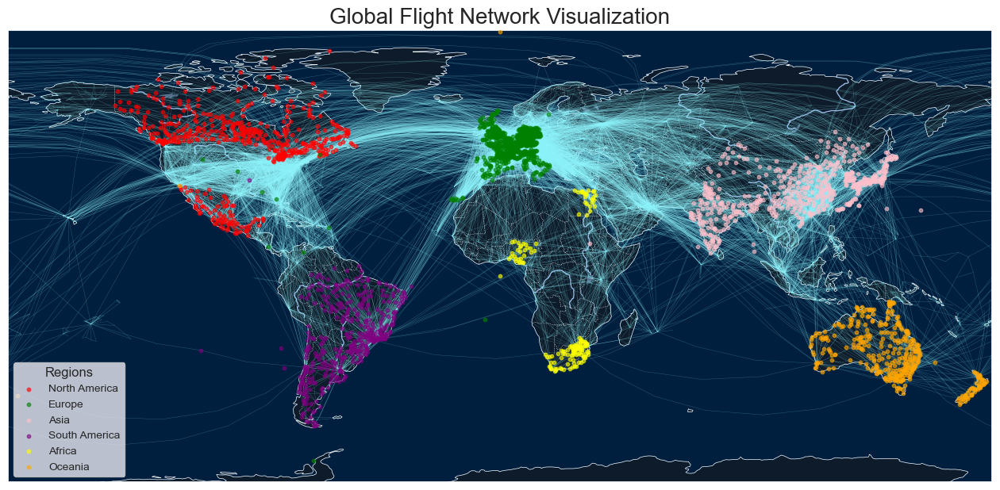

In [78]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import requests
from io import StringIO

# Download datasets
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

airports_data = requests.get(airports_url).content.decode('utf-8')
routes_data = requests.get(routes_url).content.decode('utf-8')

# Load datasets into pandas dataframes
airports_cols = ['AirportID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_cols = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

airports_df = pd.read_csv(StringIO(airports_data), header=None, names=airports_cols)
routes_df = pd.read_csv(StringIO(routes_data), header=None, names=routes_cols)

# Create a graph
G = nx.Graph()

# Add edges to the graph based on routes
for index, row in routes_df.iterrows():
    if G.has_edge(row['SourceAirport'], row['DestinationAirport']):
        G[row['SourceAirport']][row['DestinationAirport']]['weight'] += 1  # Increase weight if the edge already exists
    else:
        G.add_edge(row['SourceAirport'], row['DestinationAirport'], weight=1)

# Initialize Cartopy projection
fig = plt.figure(figsize=(16, 12))
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add map features
ax.add_feature(cfeature.LAND, color='#0d1b2a', zorder=0)  # 深色陆地
ax.add_feature(cfeature.OCEAN, color='#001f3f', zorder=0)  # 深蓝色海洋
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle=':', linewidth=0.5)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', linewidth=0.5)
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS)

# Plot flight paths with varying thickness
for edge in G.edges(data=True):
    source = airports_df[airports_df['IATA'] == edge[0]]
    dest = airports_df[airports_df['IATA'] == edge[1]]
    
    if not source.empty and not dest.empty:
        # Get coordinates for source and destination
        src_lon, src_lat = source.iloc[0]['Longitude'], source.iloc[0]['Latitude']
        dest_lon, dest_lat = dest.iloc[0]['Longitude'], dest.iloc[0]['Latitude']
        
        # Draw flight paths
        # 使用青蓝色渐变线条
        plt.plot(
            [src_lon, dest_lon], [src_lat, dest_lat], 
            color='#91f7ff',  # 青蓝色线条
            alpha=0.3,  # 半透明
            linewidth=0.3,  # 线条宽度
            transform=ccrs.Geodetic(),
            zorder=2  # 确保线条在地形之上
        )

# Add airports (nodes) colored by region
regions = {
    'North America': ['USA', 'Canada', 'Mexico'],
    'Europe': ['United Kingdom', 'Germany', 'France', 'Italy', 'Spain'],
    'Asia': ['China', 'Japan', 'India', 'South Korea'],
    'South America': ['Brazil', 'Argentina', 'Chile'],
    'Africa': ['South Africa', 'Egypt', 'Nigeria'],
    'Oceania': ['Australia', 'New Zealand']
}

# Map region colors
colors = {
    'North America': 'red',
    'Europe': 'green',
    'Asia': 'pink',
    'South America': 'purple',
    'Africa': 'yellow',
    'Oceania': 'orange'
}

for region, countries in regions.items():
    region_airports = airports_df[airports_df['Country'].isin(countries)]
    plt.scatter(region_airports['Longitude'], region_airports['Latitude'], color=colors[region], label=region, s=10, transform=ccrs.PlateCarree(), alpha=0.6, zorder=5)

# Add a legend for regions
plt.legend(loc='lower left', fontsize='small', title="Regions")

# Add a title
plt.title("Global Flight Network Visualization", size=20)

# Show the plot
plt.show()


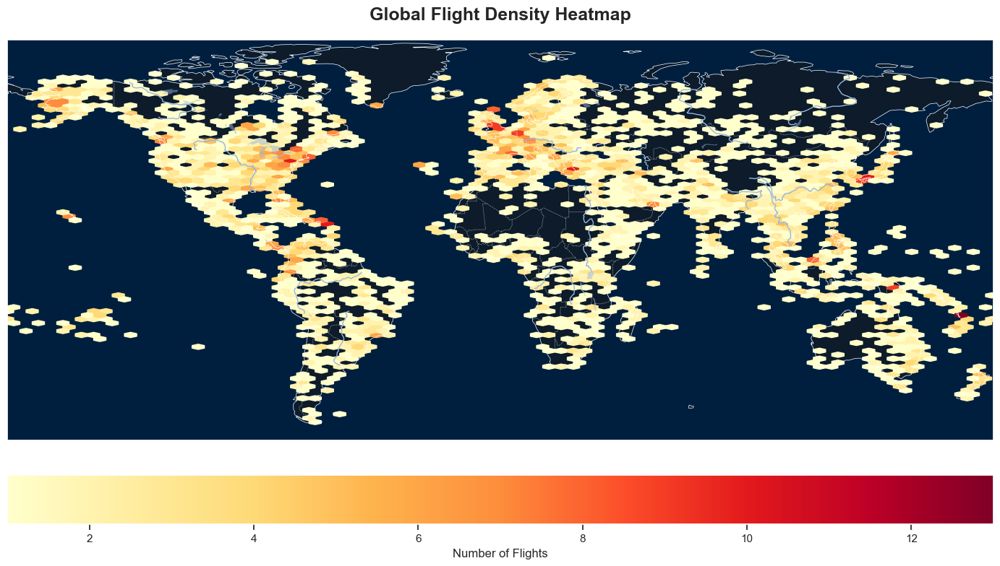

In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the datasets (airports and routes)
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_columns = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

# Load datasets
airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)
routes_df = pd.read_csv(routes_url, header=None, names=routes_columns)

# Extract flight paths
all_flight_paths = pd.concat([routes_df['SourceAirport'], routes_df['DestinationAirport']]).unique()
all_airports_coords = airports_df[airports_df['IATA'].isin(all_flight_paths)]

# Create the plot
fig = plt.figure(figsize=(14, 10))

# Set up the projection for plotting on a world map
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographic features
ax.add_feature(cfeature.LAND, color='#0d1b2a', zorder=0)  # 深色陆地
ax.add_feature(cfeature.OCEAN, color='#001f3f', zorder=0)  # 深蓝色海洋
ax.add_feature(cfeature.BORDERS, edgecolor='white', linestyle=':', linewidth=0.5)
ax.add_feature(cfeature.COASTLINE, edgecolor='white', linewidth=0.5)
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.RIVERS)


# Plot hexbin heatmap of flight density
hb = ax.hexbin(all_airports_coords['Longitude'], all_airports_coords['Latitude'], gridsize=80, cmap='YlOrRd', mincnt=1, 
               transform=ccrs.PlateCarree())

# Add color bar
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05)
cb.set_label('Number of Flights')

# Title and layout adjustments
ax.set_title('Global Flight Density Heatmap', fontsize=18, weight='bold', pad=20)
plt.tight_layout()

# Display the plot
plt.show()


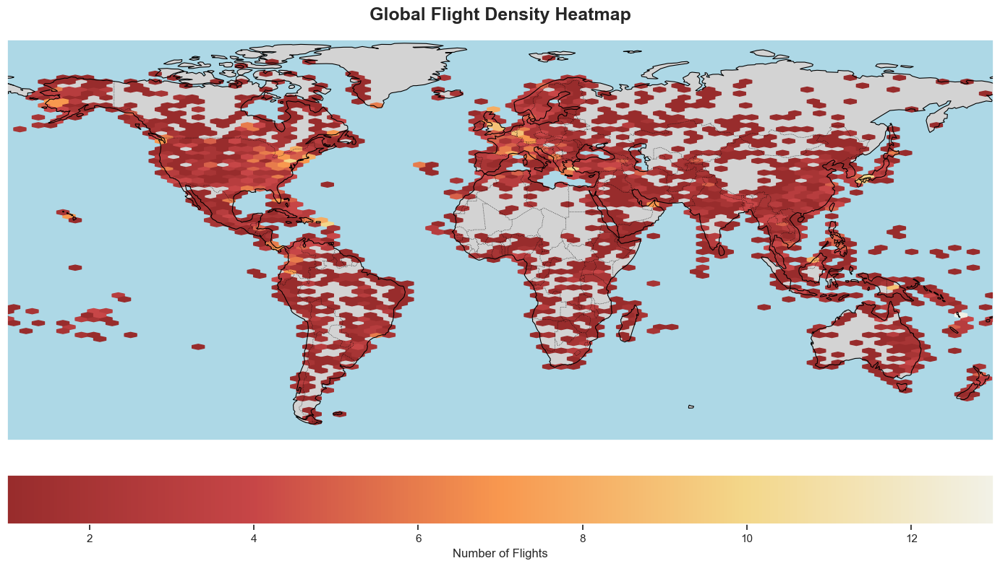

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap

# Load the datasets (airports and routes)
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_columns = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

# Load datasets
airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)
routes_df = pd.read_csv(routes_url, header=None, names=routes_columns)

# Extract flight paths
all_flight_paths = pd.concat([routes_df['SourceAirport'], routes_df['DestinationAirport']]).unique()
all_airports_coords = airports_df[airports_df['IATA'].isin(all_flight_paths)]

# Custom colormap based on the provided colors
colors = ['#982C2C', '#C74647', '#F8984F', '#F3D78A', '#F2F1E6']
cmap = LinearSegmentedColormap.from_list('CustomMap', colors)

# Create the plot
fig = plt.figure(figsize=(14, 10))

# Set up the projection for plotting on a world map
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographic features
ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

# Plot hexbin heatmap of flight density
hb = ax.hexbin(all_airports_coords['Longitude'], all_airports_coords['Latitude'], gridsize=80, cmap=cmap, mincnt=1, 
               transform=ccrs.PlateCarree())

# Add color bar
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05)
cb.set_label('Number of Flights')

# Title and layout adjustments
ax.set_title('Global Flight Density Heatmap', fontsize=18, weight='bold', pad=20)
plt.tight_layout()

# Display the plot
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_land.zip

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_ocean.zip

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_coastline.zip

/opt/anaconda3/lib/python3.12/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_boundary_lines_land.zip



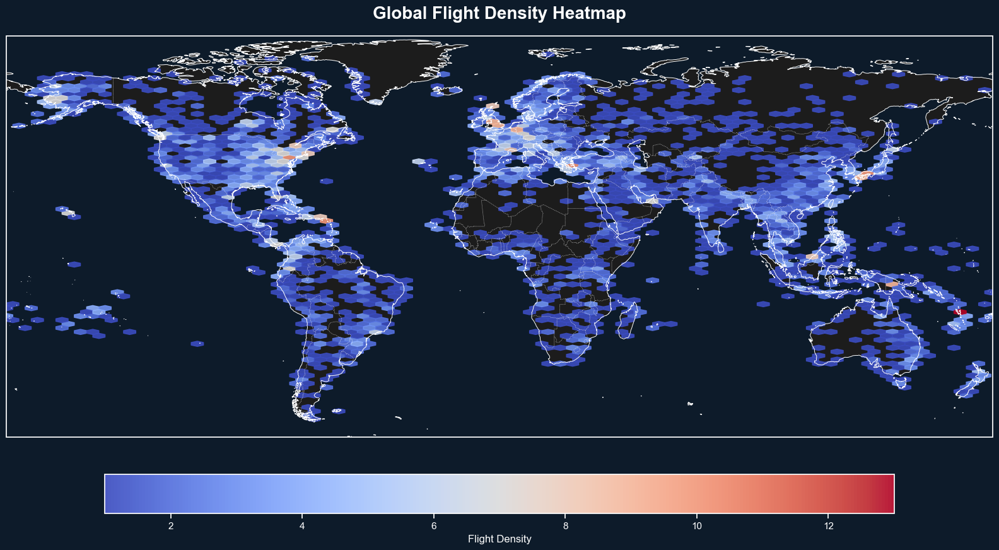

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the datasets (airports and routes)
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
routes_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat'

airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
routes_columns = ['Airline', 'AirlineID', 'SourceAirport', 'SourceAirportID', 'DestinationAirport', 'DestinationAirportID', 'Codeshare', 'Stops', 'Equipment']

# Load datasets
airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)
routes_df = pd.read_csv(routes_url, header=None, names=routes_columns)

# Extract flight paths
all_flight_paths = pd.concat([routes_df['SourceAirport'], routes_df['DestinationAirport']]).unique()
all_airports_coords = airports_df[airports_df['IATA'].isin(all_flight_paths)]

# Create the plot
fig = plt.figure(figsize=(16, 12))

# Set up the projection for plotting on a world map
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographic features with high resolution
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.7, edgecolor='white')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':', linewidth=0.5, edgecolor='white')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#1c1c1c')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='#0d1b2a')

# Plot hexbin heatmap of flight density
hb = ax.hexbin(all_airports_coords['Longitude'], all_airports_coords['Latitude'], gridsize=80, cmap='coolwarm', mincnt=1, 
               alpha=0.9, transform=ccrs.PlateCarree())

# Add color bar with modern styling
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05, shrink=0.8)
cb.set_label('Flight Density', fontsize=12, color='white')
cb.ax.xaxis.set_tick_params(color='white')
cb.outline.set_edgecolor('white')
plt.setp(plt.getp(cb.ax.axes, 'xticklabels'), color='white')

# Set dark theme for the title
ax.set_title('Global Flight Density Heatmap', fontsize=20, weight='bold', pad=20, color='white')

# Set dark background
fig.patch.set_facecolor('#0d1b2a')
ax.set_facecolor('#0d1b2a')

# Layout adjustments
plt.tight_layout()

# Display the plot
plt.show()

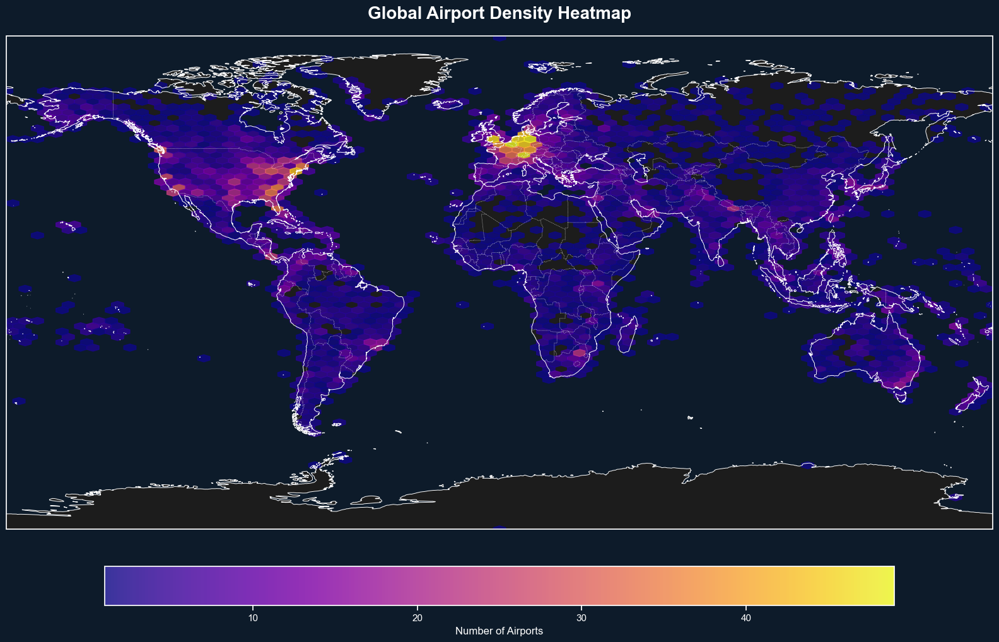

In [92]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the dataset (airports)
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']

# Load the dataset
airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)

# Extract latitude and longitude for plotting
latitudes = airports_df['Latitude']
longitudes = airports_df['Longitude']

# Create the plot
fig = plt.figure(figsize=(16, 12))

# Set up the projection for plotting on a world map
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographic features with high resolution
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.7, edgecolor='white')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':', linewidth=0.5, edgecolor='white')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#1c1c1c')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='#0d1b2a')

# Plot hexbin heatmap of airport density
hb = ax.hexbin(longitudes, latitudes, gridsize=80, cmap='plasma', mincnt=1, alpha=0.8, transform=ccrs.PlateCarree())

# Add color bar with modern styling
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05, shrink=0.8)
cb.set_label('Number of Airports', fontsize=12, color='white')
cb.ax.xaxis.set_tick_params(color='white')
cb.outline.set_edgecolor('white')
plt.setp(plt.getp(cb.ax.axes, 'xticklabels'), color='white')

# Set dark theme for the title
ax.set_title('Global Airport Density Heatmap', fontsize=20, weight='bold', pad=20, color='white')

# Set dark background
fig.patch.set_facecolor('#0d1b2a')
ax.set_facecolor('#0d1b2a')

# Layout adjustments
plt.tight_layout()

# Display the plot
plt.show()

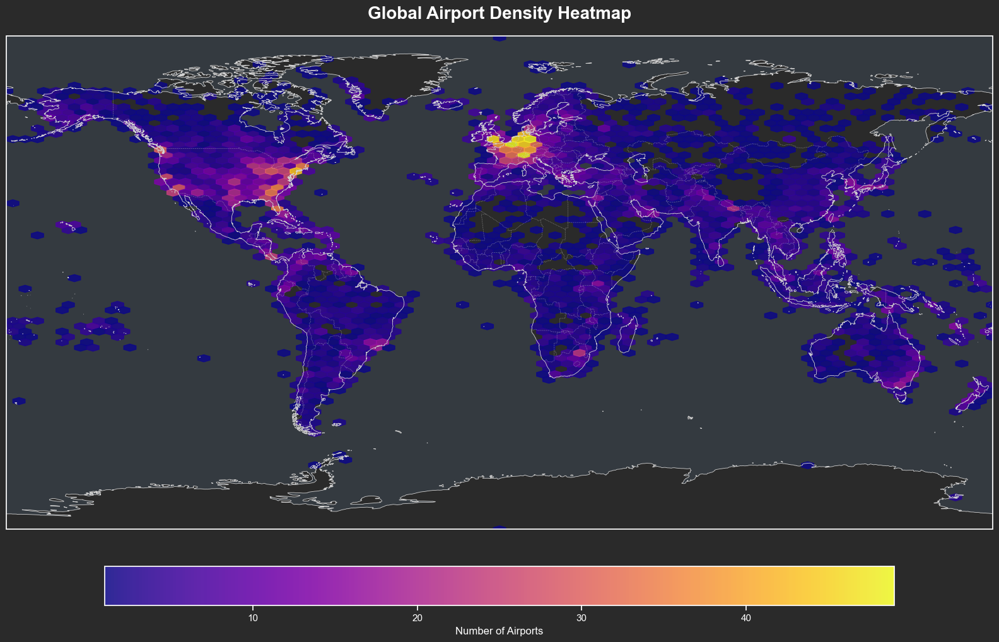

In [94]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the dataset (airports)
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']

# Load the dataset
airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)

# Extract latitude and longitude for plotting
latitudes = airports_df['Latitude']
longitudes = airports_df['Longitude']

# Create the plot
fig = plt.figure(figsize=(16, 12))

# Set up the projection for plotting on a world map
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographic features with high resolution
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.6, edgecolor='lightgray')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':', linewidth=0.4, edgecolor='lightgray')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#2a2a2a')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='#343a40')  # 淡化的深灰色背景

# Plot hexbin heatmap of airport density
hb = ax.hexbin(longitudes, latitudes, gridsize=80, cmap='plasma', mincnt=1, alpha=0.85, transform=ccrs.PlateCarree())

# Add color bar with modern styling
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05, shrink=0.8)
cb.set_label('Number of Airports', fontsize=12, color='white')
cb.ax.xaxis.set_tick_params(color='white')
cb.outline.set_edgecolor('white')
plt.setp(plt.getp(cb.ax.axes, 'xticklabels'), color='white')

# Set dark theme for the title
ax.set_title('Global Airport Density Heatmap', fontsize=20, weight='bold', pad=20, color='white')

# Set slightly lighter background
fig.patch.set_facecolor('#2a2a2a')
ax.set_facecolor('#2a2a2a')

# Layout adjustments
plt.tight_layout()

# Display the plot
plt.show()

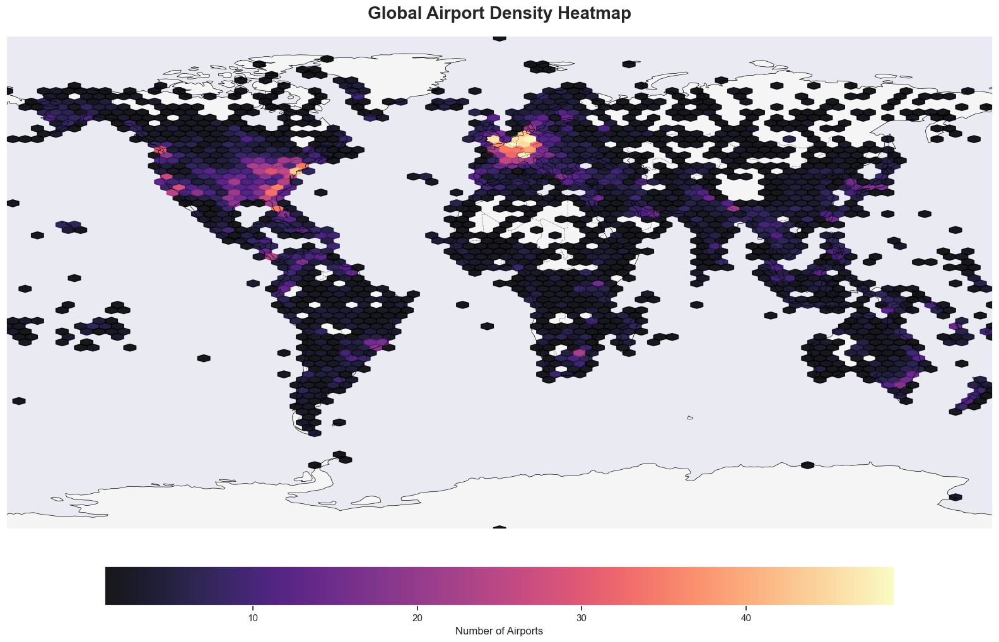

In [96]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# 加载数据
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']

airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)
latitudes = airports_df['Latitude']
longitudes = airports_df['Longitude']

# 创建绘图
fig = plt.figure(figsize=(16, 12))
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# 背景地图特征
ax.add_feature(cfeature.LAND, facecolor='whitesmoke')  # 用浅灰色背景替代深色背景
ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='black')
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5, edgecolor='black')

# 绘制机场密度热力图
hb = ax.hexbin(longitudes, latitudes, gridsize=80, cmap='magma', mincnt=1, alpha=0.9, transform=ccrs.PlateCarree())

# 添加色标和标题
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05, shrink=0.8)
cb.set_label('Number of Airports', fontsize=12)
ax.set_title('Global Airport Density Heatmap', fontsize=20, weight='bold', pad=20)

# 调整布局
plt.tight_layout()
plt.show()

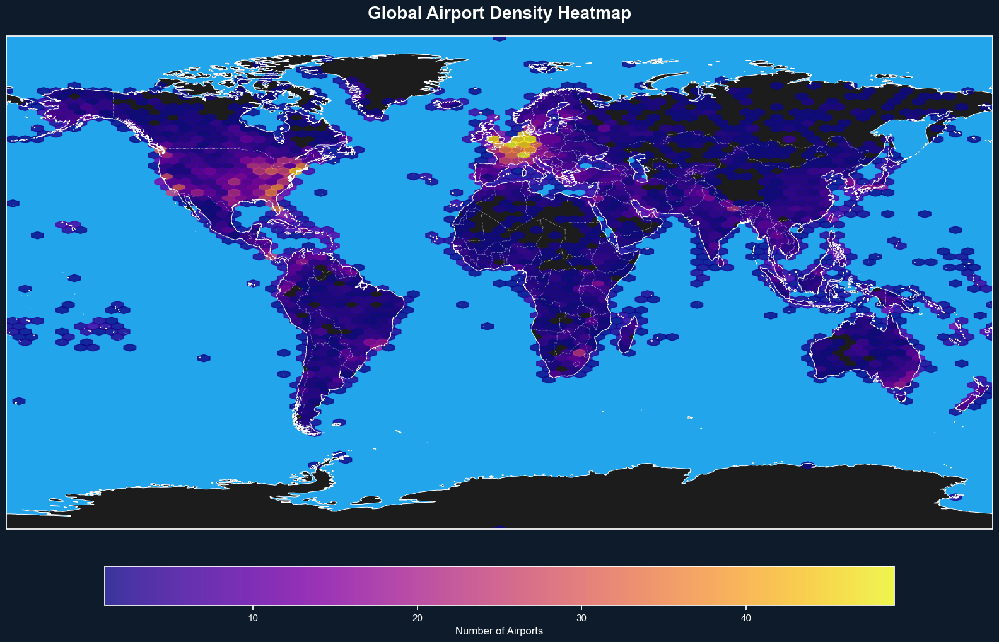

In [104]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the dataset (airports)
airports_url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
airports_columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']

# Load the dataset
airports_df = pd.read_csv(airports_url, header=None, names=airports_columns)

# Extract latitude and longitude for plotting
latitudes = airports_df['Latitude']
longitudes = airports_df['Longitude']

# Create the plot
fig = plt.figure(figsize=(16, 12))

# Set up the projection for plotting on a world map
ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Add geographic features with high resolution
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.7, edgecolor='white')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':', linewidth=0.5, edgecolor='white')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#1c1c1c')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='#22A5EB')

# Plot hexbin heatmap of airport density
hb = ax.hexbin(longitudes, latitudes, gridsize=80, cmap='plasma', mincnt=1, alpha=0.8, transform=ccrs.PlateCarree())

# Add color bar with modern styling
cb = plt.colorbar(hb, ax=ax, orientation="horizontal", pad=0.05, shrink=0.8)
cb.set_label('Number of Airports', fontsize=12, color='white')
cb.ax.xaxis.set_tick_params(color='white')
cb.outline.set_edgecolor('white')
plt.setp(plt.getp(cb.ax.axes, 'xticklabels'), color='white')

# Set dark theme for the title
ax.set_title('Global Airport Density Heatmap', fontsize=20, weight='bold', pad=20, color='white')

# Set dark background
fig.patch.set_facecolor('#0d1b2a')
ax.set_facecolor('#0d1b2a')

# Layout adjustments
plt.tight_layout()

# Display the plot
plt.show()

/var/folders/48/dfqyd3313l5b1fw018vrb5qr0000gn/T/ipykernel_25478/3449284080.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




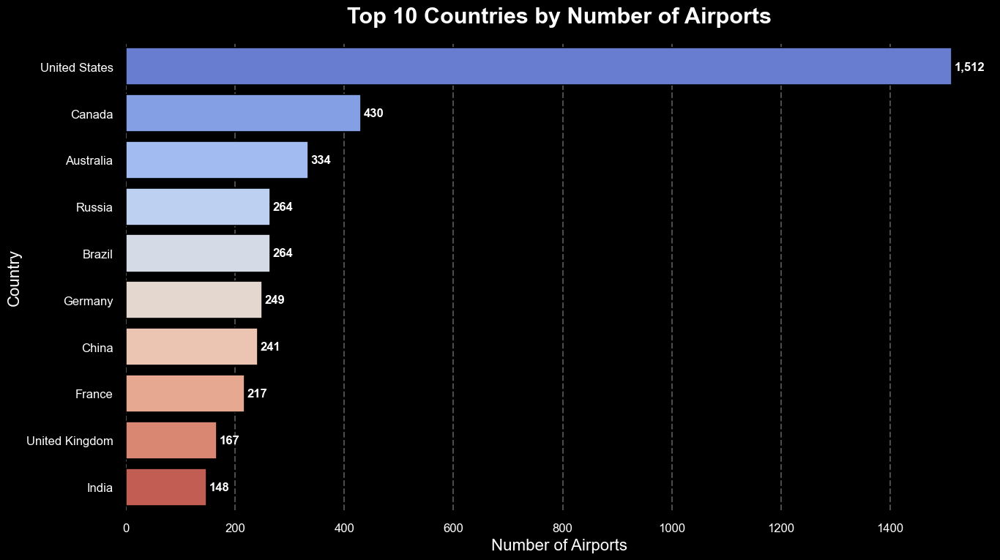

In [106]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
url = 'https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat'
columns = ['Airport_ID', 'Name', 'City', 'Country', 'IATA', 'ICAO', 'Latitude', 'Longitude', 'Altitude', 'Timezone', 'DST', 'Tz', 'Type', 'Source']
airports = pd.read_csv(url, header=None, names=columns)

# Count the number of airports by country
country_airport_count = airports['Country'].value_counts().reset_index()
country_airport_count.columns = ['Country', 'Number of Airports']

# Select top 10 countries with the most airports
top_countries = country_airport_count.head(10)

# Set plot style
sns.set(style="whitegrid", context="talk")
plt.style.use("dark_background")  # Set a dark theme for the background

# Create a figure and axis
plt.figure(figsize=(14, 8))
colors = sns.color_palette("coolwarm", len(top_countries))  # Custom color palette
bars = sns.barplot(
    x='Number of Airports', 
    y='Country', 
    data=top_countries, 
    palette=colors, 
    edgecolor="black",  # Add sharp edges for a modern look
    linewidth=1.2
)

# Add annotations to show exact numbers on the bars
for index, value in enumerate(top_countries['Number of Airports']):
    bars.text(value + 5, index, f'{value:,}', color='white', va="center", fontsize=12, weight='bold')

# Set plot title and labels
plt.title('Top 10 Countries by Number of Airports', fontsize=22, weight='bold', pad=20, color='white')
plt.xlabel('Number of Airports', fontsize=16, color='white')
plt.ylabel('Country', fontsize=16, color='white')

# Improve plot aesthetics
sns.despine(left=True, bottom=True)
plt.grid(axis='x', linestyle='--', alpha=0.3, color='white')  # Light gridlines for guidance

# Customize the ticks
plt.xticks(fontsize=12, color='white')
plt.yticks(fontsize=12, color='white')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()